In [1]:
%run ./DataPreprocessing.ipynb
import pm4py

In [2]:
event_log = pm4py.format_dataframe(pd.read_csv('Sample_Dataset_2.csv', sep=','), case_id='Company.ID',
                                      activity_key='event', timestamp_key='time',timest_format='%d/%m/%Y %H:%M')
pm4py.write_xes(event_log, 'Sample_Dataset_2.xes')

/var/folders/fd/kfk54krs71n84hqlgtzj6g040000gn/T/ipykernel_15105/3988089877.py:1: DtypeWarning: Columns (2,3,6,9,10,12) have mixed types. Specify dtype option on import or set low_memory=False.
  event_log = pm4py.format_dataframe(pd.read_csv('Sample_Dataset_2.csv', sep=','), case_id='Company.ID',
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pm4py/utils.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[constants.CASE_CONCEPT_NAME] = df[constants.CASE_CONCEPT_NAME].astype("string")
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pm4py/utils.py:89: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = 

exporting log, completed traces ::   0%|          | 0/2911 [00:00<?, ?it/s]

In [3]:
import pm4py
log = pm4py.read_xes('Sample_Dataset_2.xes')
map = pm4py.discover_heuristics_net(log)
pm4py.view_heuristics_net(map)

parsing log, completed traces ::   0%|          | 0/2911 [00:00<?, ?it/s]

In [4]:
data=readCSV('Sample_Dataset_2.csv','time')

/var/folders/fd/kfk54krs71n84hqlgtzj6g040000gn/T/ipykernel_15105/1785001696.py:6: DtypeWarning: Columns (2,3,6,9,10,12) have mixed types. Specify dtype option on import or set low_memory=False.
  csv_data = pd.read_csv(filename)


In [5]:
data=cleanAllHeaders(data)

In [6]:
data=selectColumns(data,['company_id','event','time','client','template',
                         'guide_name','guide_type','number_of_graphs','number_of_graphs_on_dashboard',
                         'graph_origin','source','kpi_count','account_type','graphs_owned','data_format',
                         'dashboard_template_name','x_city','weekday'])

In [7]:
data=filterRows(data,'company_id!=""')

In [8]:
data= filterRows(data,'client != "Phone App" & event != "View Dashboard"')

In [9]:
data=removeEventsLowFrequency(data, 'event', 10) 

In [10]:
data=ArrangeRows(data,["company_id","time"])

In [11]:
data=deleteTruncatedTracesStart(data,'company_id','event',"Trial Sign Up Completed")

In [12]:
data=deleteTruncatedTracesEnd(data,'company_id','event',"Purchase Confirm Details")

In [13]:
deleteTraceLengthLessThan(data,'company_id',2)

,company_id,event,time,client,template,guide_name,guide_type,number_of_graphs,number_of_graphs_on_dashboard,graph_origin,source,kpi_count,account_type,graphs_owned,data_format,dashboard_template_name,x_city,weekday
24819,6ffafc313e94655e00e3d1127ef3f24b,Trial Sign Up Completed,8/2/2018 8:25,NaN,NaN,NaN,NaN,8.0,NaN,NaN,2.0,NaN,Direct,NaN,NaN,NaN,Fort Lauderdale,Thursday
24820,6ffafc313e94655e00e3d1127ef3f24b,Guide Start,8/2/2018 8:25,NaN,NaN,NavBar Intro Tour - Automatic,walkthrough,8.0,NaN,NaN,2.0,NaN,Direct,NaN,NaN,NaN,Fort Lauderdale,Thursday
24822,6ffafc313e94655e00e3d1127ef3f24b,Guide Exit,8/2/2018 8:25,NaN,NaN,NavBar Intro Tour - Automatic,walkthrough,8.0,NaN,NaN,2.0,NaN,Direct,NaN,NaN,NaN,Fort Lauderdale,Thursday
24823,6ffafc313e94655e00e3d1127ef3f24b,Guide Start,8/2/2018 8:25,NaN,NaN,NavBar Intro Tour - Automatic,walkthrough,8.0,NaN,NaN,2.0,NaN,Direct,NaN,NaN,NaN,Fort Lauderdale,Thursday
24824,6ffafc313e94655e00e3d1127ef3f24b,Guide Exit,8/2/2018 8:25,NaN,NaN,NavBar Intro Tour - Automatic,walkthrough,8.0,NaN,NaN,2.0,NaN,Direct,NaN,NaN,NaN,Fort Lauderdale,Thursday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14568,f5067bb522279c9e9972da3a6c4a1eb2,Purchase Confirm Details,8/1/2018 16:45,NaN,NaN,NaN,NaN,8.0,NaN,NaN,2.0,NaN,Direct,NaN,NaN,NaN,Ottawa,Wednesday
14571,f5067bb522279c9e9972da3a6c4a1eb2,Purchase Billing Details,8/1/2018 16:45,NaN,NaN,NaN,NaN,8.0,NaN,NaN,2.0,NaN,Direct,NaN,NaN,NaN,Ottawa,Wednesday
14574,f5067bb522279c9e9972da3a6c4a1eb2,Purchase Confirm Details,8/1/2018 16:45,NaN,NaN,NaN,NaN,8.0,NaN,NaN,2.0,NaN,Direct,NaN,NaN,NaN,Ottawa,Wednesday
14577,f5067bb522279c9e9972da3a6c4a1eb2,Purchase Company Details,8/1/2018 16:45,NaN,NaN,NaN,NaN,8.0,NaN,NaN,2.0,NaN,Direct,NaN,NaN,NaN,Ottawa,Wednesday


In [14]:
writeCSV(data,'filteredSample_Dataset_2.csv')

In [15]:
event_log = pm4py.format_dataframe(pd.read_csv('filteredSample_Dataset_2.csv', sep=','), case_id='company_id',
                                      activity_key='event', timestamp_key='time',timest_format='%d/%m/%Y %H:%M')
pm4py.write_xes(event_log, 'filteredSample_Dataset_2.xes')

exporting log, completed traces ::   0%|          | 0/2 [00:00<?, ?it/s]

parsing log, completed traces ::   0%|          | 0/2 [00:00<?, ?it/s]

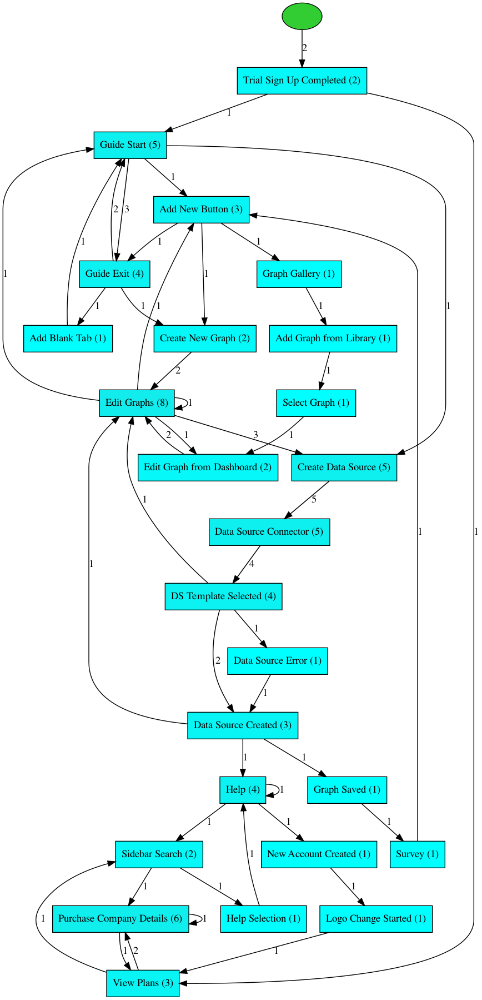

In [16]:
log = pm4py.read_xes('filteredSample_Dataset_2.xes')
map = pm4py.discover_heuristics_net(log)
pm4py.view_heuristics_net(map)